<a href="https://colab.research.google.com/github/datascientistlg/Mundo-R/blob/Miner%C3%ADa-de-procesos/mineria_de_procesos_con_r.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Una vista rápida de Minería de Procesos con R

## Introducción

La minería de procesos es una disciplina que tiene como objetivo descubrir, monitorear y mejorar procesos de negocio a través del análisis del registro de los eventos del proceso que se encuentran almacenados en los sistemas de información. Actualmente los procesos de negocio de las organizaciones están soportados por sistemas de información que registran datos valiosos con respecto a ejecutores, actividades, eventos, tiempos y variables asociadas a la ejecución de los procesos. Esta información puede ser aprovechada con técnicas de la minería de datos, más específicamente, de la minería de procesos para descubrir la realidad de cómo se están ejecutando los procesos y de esta forma tomar decisiones para mejorarlos (Van der Aalst, 2011).

La ejecución histórica de un proceso se registra en los llamados "event log" (regisro de eventos). En estos registros se encuentran los casos o instancias del proceso (ej. Reclamo sobre un servicio recibido), las actividades del proceso (ej. Derivar el reclamo al área de atención al cliente), las personas que ejecutan cada actividad (ej. Javier López - Analista del área de reclamos), la fecha y hora en el que inicia y culmina cada actividad (ej. Inicio: 12/05/2022; 09:35:00, Fin: 14/05/2022; 15:03:00) y un complemento de otros datos qu epermiten analizar con mayor detalle al proceso (ej. Tipo de reclamo, proveedor, persona que brindó la atención).

La minería de procesos persigue el mejoramiento de los procesos a través de herramientas de análisis de datos. En la siguiente figura se muestra el posicionamiento de los tres tipos principales de minería de procesos: descubrimiento, conformidad y mejora (Van der Aalst, 2011).

<img src="Figura PM.jpg">

## La librería bupaR 

bupaR es un conjunto integrado de paquetes R de código abierto para el manejo y análisis de datos de procesos comerciales. bupaR brinda soporte para diferentes etapas en el análisis de procesos, como la importación y el preprocesamiento de datos de eventos, el cálculo de estadísticas descriptivas, la visualización de procesos y la verificación de conformidad (Janssenswillen, G., 2011).

Al cargar bupaR, carga otros paquetes (ej. eventdataR, processmapR) que se utilizan para minería de procesos. Si bien un registro de eventos se puede almacenar como "data frame", también se puede almacenar como un objeto de registro de eventos de bupaR. Almacenar el registro de eventos como un objeto de registro de eventos le permite usar las funciones de bupaR para analizar y visualizar el registro de eventos con facilidad.

Para utilizar BupaR, debemos intalar los siguientes paquetes:

In [ ]:
install.packages("bupaR")
install.packages("edeaR")
install.packages("eventdataR")
install.packages("processmapR")
install.packages("processmonitR")
install.packages("xesreadR")
install.packages("petrinetR")

Installing package into ‘/usr/local/lib/R/site-library’
(as ‘lib’ is unspecified)

also installing the dependencies ‘Rcpp’, ‘httpuv’, ‘xtable’, ‘fontawesome’, ‘sourcetools’, ‘later’, ‘promises’, ‘shiny’, ‘miniUI’, ‘eventdataR’


Installing package into ‘/usr/local/lib/R/site-library’
(as ‘lib’ is unspecified)

also installing the dependencies ‘ggthemes’, ‘shinyTime’, ‘zoo’


Installing package into ‘/usr/local/lib/R/site-library’
(as ‘lib’ is unspecified)

Installing package into ‘/usr/local/lib/R/site-library’
(as ‘lib’ is unspecified)

also installing the dependencies ‘gridExtra’, ‘downloader’, ‘htmlwidgets’, ‘igraph’, ‘influenceR’, ‘viridis’, ‘visNetwork’, ‘lazyeval’, ‘crosstalk’, ‘DiagrammeR’, ‘plotly’, ‘BH’


Installing package into ‘/usr/local/lib/R/site-library’
(as ‘lib’ is unspecified)

Installing package into ‘/usr/local/lib/R/site-library’
(as ‘lib’ is unspecified)

also installing the dependency ‘XML’


Installing package into ‘/usr/local/lib/R/site-library’
(as ‘lib’ is un

In [ ]:
library(bupaR)

Warning message in system("timedatectl", intern = TRUE):
“running command 'timedatectl' had status 1”

Attaching package: ‘bupaR’


The following object is masked from ‘package:stats’:

    filter


The following object is masked from ‘package:utils’:

    timestamp




## Datos para el ejemplo

Para el ejemplo utilizamos un archivo de registro de eventos ficticio, que proporciona la libreria "eventdataR". Estos datos corresponden a pacientes que ingresan a una centro de salud para ser atendidos, inciando teóricamente, en el registro del paciente hasta la obtención de su diagnóstico. Los datos han sido exportados a formato csv y traducidos al español con algunas modificaciones propias, que creo ayuda a entenderos mejor.

La siguiente imagen muestra el registro de eventos para el paciente 6. Se indica la actividad realizada, la persona que atendió al paciente, un código de actividad, la condición de la actividad (inicio / fin) y cuando inició o terminó la actividad (marca_tiempo).

<img src="imagen_eventlog.jpg">

## Cargando los datos

Como se indicó, los datos han sido exportados a formato csv; esto con la finalidad de mostrar que podemos tener los datos en dicho formato para ser cargados a R y transformarlos en un registro de eventos que pueda ser utilizado por las herraientas de bupaR. 

In [ ]:
library(readr)
pacientes <- read.csv("eventlog.csv", sep=";")
head(pacientes)

,actividad,paciente,empleado,id_actividad,condicion,marca_tiempo
,<chr>,<int>,<chr>,<int>,<chr>,<chr>
1,Registro,1,Jaime,1,inicio,02/01/2017 11:41:53
2,Registro,2,Jaime,2,inicio,02/01/2017 11:41:53
3,Registro,3,Jaime,3,inicio,04/01/2017 01:34:05
4,Registro,4,Jaime,4,inicio,04/01/2017 01:34:04
5,Registro,5,Jaime,5,inicio,04/01/2017 16:07:47
6,Registro,6,Jaime,6,inicio,04/01/2017 16:07:47


Como la variable "marca_tiempo" se importó con formato character, lo debemos convertir a tipo Date

In [ ]:
pacientes$marca_tiempo <- as.POSIXct(pacientes$marca_tiempo, format= "%d/%m/%Y %H:%M:%S")
pacientes$actividad <- factor(pacientes$actividad)
pacientes$empleado <- factor(pacientes$empleado)
pacientes$condicion <- factor(pacientes$condicion)
pacientes$paciente <- as.character(pacientes$paciente)
pacientes$id_actividad <- as.character(pacientes$id_actividad)
head(pacientes)

,actividad,paciente,empleado,id_actividad,condicion,marca_tiempo
,<fct>,<chr>,<fct>,<chr>,<fct>,<dttm>
1,Registro,1,Jaime,1,inicio,2017-01-02 11:41:53
2,Registro,2,Jaime,2,inicio,2017-01-02 11:41:53
3,Registro,3,Jaime,3,inicio,2017-01-04 01:34:05
4,Registro,4,Jaime,4,inicio,2017-01-04 01:34:04
5,Registro,5,Jaime,5,inicio,2017-01-04 16:07:47
6,Registro,6,Jaime,6,inicio,2017-01-04 16:07:47


Luego de importar los datos y configurada la variable tipo Date, convertimos el Data.Frame en formato "eventlog". Con este paso, el registro de eventos queda listo para aplicar las funciones de minería de datos.

In [ ]:
library(bupaR)
eventos <- eventlog(pacientes,
               case_id = "paciente",
               activity_id = "actividad",
               activity_instance_id = "id_actividad",
               lifecycle_id = "condicion",
               timestamp = "marca_tiempo",
               resource_id = "empleado")
head(eventos)

actividad,paciente,empleado,id_actividad,condicion,marca_tiempo,.order
<fct>,<chr>,<fct>,<chr>,<fct>,<dttm>,<int>
Registro,1,Jaime,1,inicio,2017-01-02 11:41:53,1
Registro,2,Jaime,2,inicio,2017-01-02 11:41:53,2
Registro,3,Jaime,3,inicio,2017-01-04 01:34:05,3
Registro,4,Jaime,4,inicio,2017-01-04 01:34:04,4
Registro,5,Jaime,5,inicio,2017-01-04 16:07:47,5
Registro,6,Jaime,6,inicio,2017-01-04 16:07:47,6


## Una exploración rápida del total de eventos

In [ ]:
str(eventos)
summary(eventos)

eventlog [5,442 × 7] (S3: eventlog/log/tbl_df/tbl/data.frame)
 $ actividad   : Factor w/ 7 levels "Diagnostico",..: 4 4 4 4 4 4 4 4 4 4 ...
 $ paciente    : chr [1:5442] "1" "2" "3" "4" ...
 $ empleado    : Factor w/ 7 levels "Camila","Carlos",..: 6 6 6 6 6 6 6 6 6 6 ...
 $ id_actividad: chr [1:5442] "1" "2" "3" "4" ...
 $ condicion   : Factor w/ 2 levels "fin","inicio": 2 2 2 2 2 2 2 2 2 2 ...
 $ marca_tiempo: POSIXct[1:5442], format: "2017-01-02 11:41:53" "2017-01-02 11:41:53" ...
 $ .order      : int [1:5442] 1 2 3 4 5 6 7 8 9 10 ...
 - attr(*, "case_id")= chr "paciente"
 - attr(*, "activity_id")= chr "actividad"
 - attr(*, "activity_instance_id")= chr "id_actividad"
 - attr(*, "lifecycle_id")= chr "condicion"
 - attr(*, "resource_id")= chr "empleado"
 - attr(*, "timestamp")= chr "marca_tiempo"
Number of events:  5442
Number of cases:  500
Number of traces:  7
Number of distinct activities:  7
Average trace length:  10.884

Start eventlog:  2017-01-02 11:41:53
End eventlog:  2018-05

                actividad      paciente             empleado   
 Diagnostico         : 990   Length:5442        Camila  : 984  
 Prueba de sangre    : 474   Class :character   Carlos  : 474  
 Radiografia         : 522   Mode  :character   Cecilia : 472  
 Registro            :1000                      Fernando: 990  
 Resonancia magnetica: 472                      Helen   :1000  
 Triaje y evaluacion :1000                      Jaime   :1000  
 Verificar           : 984                      Ofelia  : 522  
 id_actividad        condicion     marca_tiempo                   
 Length:5442        fin   :2721   Min.   :2017-01-02 11:41:53.00  
 Class :character   inicio:2721   1st Qu.:2017-05-06 17:15:18.00  
 Mode  :character                 Median :2017-09-08 04:16:50.00  
                                  Mean   :2017-09-02 20:52:34.40  
                                  3rd Qu.:2017-12-22 15:44:11.25  
                                  Max.   :2018-05-05 07:16:02.00  
                   

De los resultados se tiene que:

- Son 500 pacientes (casos)
- Existen 7 actividades
- Se realizaron 5442 eventos 

## Explorando los eventos de un paciente

In [ ]:
eventos %>% 
    filter_attributes(paciente=="3") %>%
arrange(id_actividad) #%>%

Warning message:
“`filter_attributes()` was deprecated in bupaR 0.5.0.
Please use `filter()` instead.
This warning is displayed once every 8 hours.
Call `lifecycle::last_lifecycle_warnings()` to see where this warning was generated.”


actividad,paciente,empleado,id_actividad,condicion,marca_tiempo,.order
<fct>,<chr>,<fct>,<chr>,<fct>,<dttm>,<int>
Prueba de sangre,3,Carlos,1002,inicio,2017-01-05 21:37:12,3
Prueba de sangre,3,Carlos,1002,fin,2017-01-06 03:53:14,9
Resonancia magnetica,3,Cecilia,1239,inicio,2017-01-10 04:11:31,4
Resonancia magnetica,3,Cecilia,1239,fin,2017-01-10 07:56:21,10
Diagnostico,3,Fernando,1737,inicio,2017-01-10 13:20:59,5
Diagnostico,3,Fernando,1737,fin,2017-01-10 16:12:34,11
Verificar,3,Camila,2232,inicio,2017-01-11 09:46:21,6
Verificar,3,Camila,2232,fin,2017-01-11 11:04:41,12
Registro,3,Jaime,3,inicio,2017-01-04 01:34:05,1


Se puede observar que, que la persona 3 ha pasado por 6 actividades. Además, en el registro de eventos, cada actividad está presente 2 veces, esto porque se registra la fecha y tiempo de inicio y fin de cada actividad.

## Analizando la trazabilidad

Se espera que los pacientes (casos) inicien con la activiad de "registro" y finalicenn con la actividad "verificar" Es importante analizar si existen casos que no cumplen con este supuesto, con el objetivo de encontrar los factores que no han permitido que tal supuesto se de.
Para esto, es importante analizar la trazabilidad de los casos. 

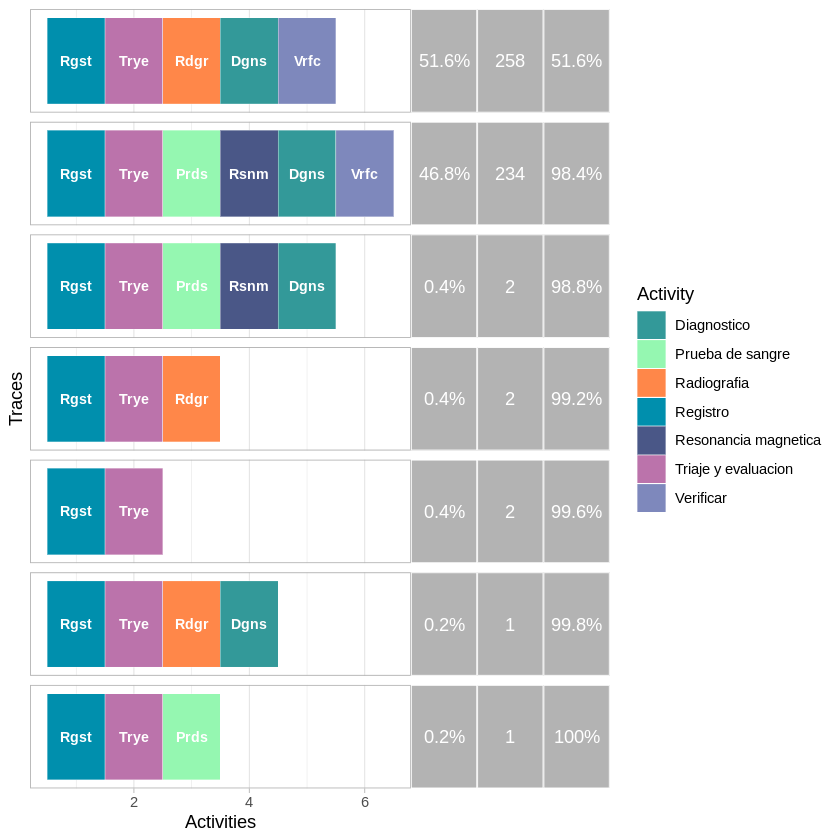

In [ ]:
eventos %>% processmapR::trace_explorer(type = "frequent", coverage = 1.0)

Podemos observar que, el 1,6% de los pacientes no llegab a la verificación de su atención. Además, existen pacientes que pasan por una radiografia y otros a una resonancia magnética previo análisis de sangre.

## ¿Cómo van a apareciendo los nuevos casos (pacientes)?

### Tasa de crecimiento de casos

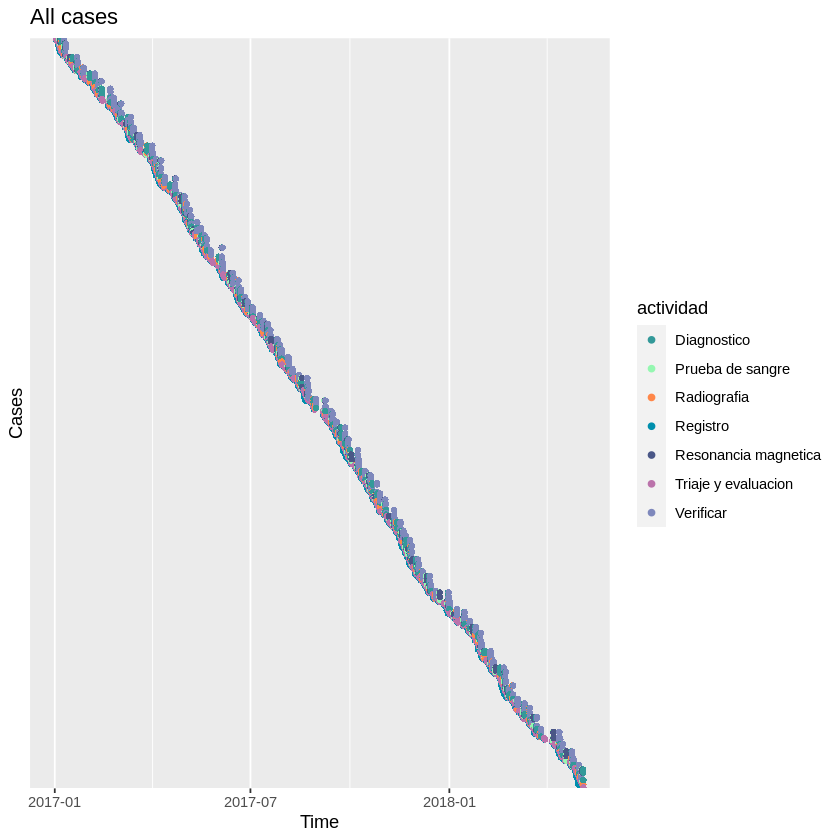

In [ ]:
library(ggplot2)
eventos %>% dotted_chart(x = "absolute", sort = "start") + ggtitle("All cases") +
  theme_gray()

El gráfico muestra una pendiente constante a lo largo del tiempo, lo que indica que la tasa de nuevos casos se mantiene constante a lo largo de los 5 trimestre del periodo evaluado.

### Duración de la secuencia de eventos

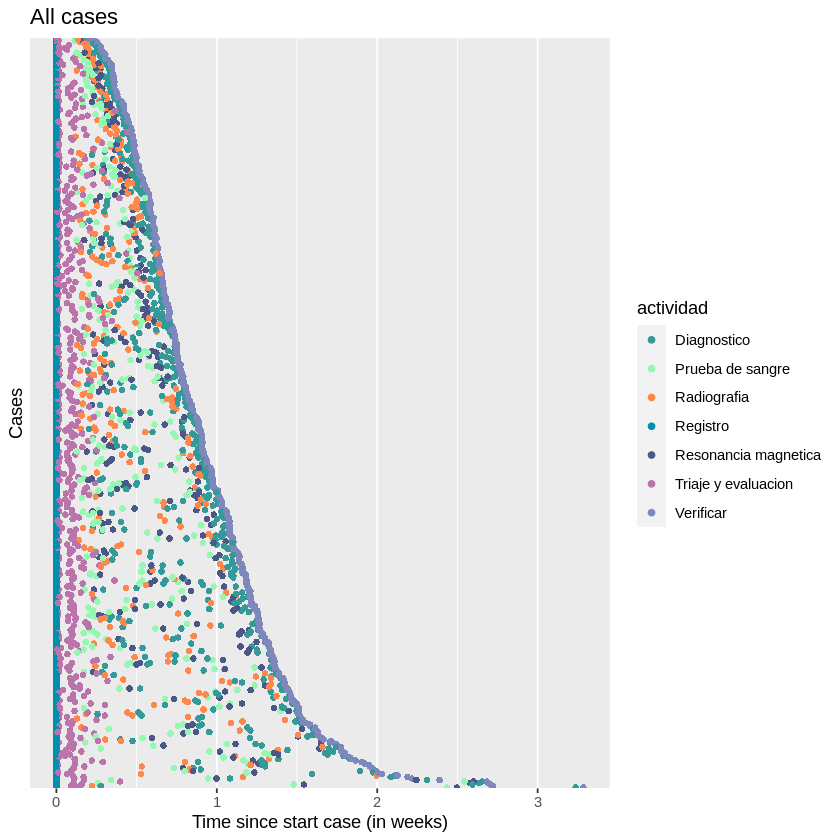

In [ ]:
eventos %>% dotted_chart(x = "relative", sort = "duration") + ggtitle("All cases") +
  theme_gray()

El gráfico anterior muestra el patrón de los casos, donde el eje x indica el tiempo desde el inicio del caso (en semanas). En este se observa que, los casos inician con el "registro" para luego pasar al "triaje y evauación". Se observa que, en aproximadamente 10 días seguidos al triaje, se muestra un patrón variable donde se realiza análisis de sangre seguid de resonancia magnética, otros la radiografía. A este patrón le sigue el diagnóstico y la verificación respectivamente.

## Descubriendo el mapa del proceso

Luego de haber realizado una exploración básica de los evento, descubramos el MAPA DEL PROCESO en base a dichos eventos. Para esto, utilizamos la función process_map(). Un mapa rápido y por defecto podemos construirlo con el siguiente script:

In [ ]:
library(bupaR)
eventos %>%
    process_map()

HTML widgets cannot be represented in plain text (need html)

Se pueden generar perfiles de mapas, cada uno de los cuales nos reporta información absoluta o relativa de los casos e instancias.

Los perfiles de mapas que se pueden generar son:

- Perfil de frecuencia
- Perfil de rendimiento
- Perfil personalizado (lo veremos en otro notebook)
- Perfiles combinados

 ### Perfil de frecuencia

Si necesitamos mostrar las frecuencias absolutas (por defecto) o relativas, los scripts son los siguientes:

In [ ]:
eventos %>%
    process_map(type = frequency("absolute"))

HTML widgets cannot be represented in plain text (need html)

In [ ]:
eventos %>%
    process_map(type = frequency("relative_case"))

HTML widgets cannot be represented in plain text (need html)

### Perfil rendimiento

Es importante analizar el tiempo en que se realizan las actividades. Para esto, generamos un perfil de rendimiento utilixando la función performance(), el cual maneja 2 argumentos: FUN para especificar la medida de resumen del tiempo de procesamiento (ejem., mín., máx., media, mediana, etc.) y el argumento UNITS para especificar la unidad de tiempo que se utilizará.

In [ ]:
eventos %>%
    process_map(performance(median, "days"))

HTML widgets cannot be represented in plain text (need html)

Si necesitamos medir el rendimiento en horas, entonces UNITS="hours". El script es el siguiente: 

In [ ]:
eventos %>%
    process_map(performance(mean, "hours"))

HTML widgets cannot be represented in plain text (need html)

## Combinación de perfiles

Podemos combinar los perfiles de borde y nodo, utilizando los atributos type_edges y type_nodes. Así, podemos combinar información sobre frecuencias y rendimiento en un mismo gráfico. El script siguiente es un ejemplo:

In [ ]:
eventos %>%
    process_map(type_nodes = frequency("relative_case"),
                type_edges = performance(mean))

HTML widgets cannot be represented in plain text (need html)

## Animando el proceso

In [ ]:
install.packages("processanimateR")
library(processanimateR)

Installing package into ‘/usr/local/lib/R/site-library’
(as ‘lib’ is unspecified)



In [ ]:
animate_process(eventos)

HTML widgets cannot be represented in plain text (need html)

## Referencia bibliográfica

Business process analytics in R. (s/f). Bupar.net. Recuperado el 19 de julio de 2022, de https://bupar.net/

Janssenswillen, G., & Depaire, B. (2017, September). bupaR: Business Process Analysis in R. In BPM (Demos).

Van der Aalst, W.M.P, Schonenberg, M., and Song, M. (2011). Time prediction based on process mining. Information Systems, 36 (2), 450-475.